In [2]:
%load_ext autoreload
%autoreload 2
# %cd /p/mmcardiac/Jerry/code/CINE-DENSE-Translation
%cd /home/jx8fh/Projects/LaMoD
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from modules.data import check_dict

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/sfs/gpfs/tardis/home/jx8fh/Projects/LaMoD


In [3]:
# load cine-DENSE data
# cine_DENSE_fname = '/p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-cine-DENSE-data/2024-04-21-matched-cine-DENSE-from-Yu-all-with-resampled.npy'
cine_DENSE_fname = '/scratch/jx8fh/2024-04-21-matched-cine-DENSE-from-Yu-all-with-resampled.npy'
cine_DENSE_data = np.load(cine_DENSE_fname, allow_pickle=True).tolist()
check_dict(cine_DENSE_data[0])

AnalysisInfo                                                 dict_keys(['ResampleMethod', 'ResampleDistance', 'SpatialSmoothing', 'TemporalOrder', 'Xseed', 'Yseed', 'Zseed', 'FramesForAnalysis', 'Nmodel', 'PositionA', 'PositionB', 'Clockwise'])
AnalysisInstanceUID                                          1.3.6.1.4.1.9590.100.1.2.64946301013757307506911904523491151334
DENSEInfo                                                    dict_keys(['Name', 'UID', 'Type', 'MagIndex', 'PhaIndex', 'Number', 'PixelSpacing', 'Scale', 'EncFreq', 'SwapFlag', 'NegFlag'])
DENSE_Eul_displacement_field_Multipliers                     (3,)                
DENSE_Eul_displacement_field_X                               (48, 48, 51)        
DENSE_Eul_displacement_field_Y                               (48, 48, 51)        
DENSE_Lag_displacement_field_X                               (48, 48, 51)        
DENSE_Lag_displacement_field_Y                               (48, 48, 51)        
DENSE_frame_indices_with_myo_co

In [4]:
# load feature tracking results
feature_tracking_fname = '/scratch/jx8fh/2024-06-22-MICCAI-ShapeMI-Workshop-data/2024-04-21-matched-cine-DENSE-from-Yu-all-feature-tracking.npy'
# feature_tracking_fname = '/p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-cine-DENSE-data/2024-04-21-matched-cine-DENSE-from-Yu-all-feature-tracking.npy'
feature_tracking_data = np.load(feature_tracking_fname, allow_pickle=True).tolist()
check_dict(feature_tracking_data[0])

AnalysisInstanceUID                                          1.3.6.1.4.1.9590.100.1.2.64946301013757307506911904523491151334
DENSE_myo_mask_bbox                                          (34, 82, 40, 88)    
DENSE_n_frames_all                                           51                  
DENSE_slice_SwapFlag                                         1                   
DENSE_slice_idx                                              0                   
DENSE_slice_location                                         76.947609505431     
DENSE_slice_mat_filename                                     /p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-DENSE-data/033_S01_base_auto.1_ROI.1.mat
cine_has_separate_mat_file                                   True                
cine_sep_mat_filename                                        /p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-analyzed-cine-data/CRT33/trufi_cine_sa_p2_13.mat
cine_slice_has_contour                                       

In [5]:
# load previous experimnents results
data_recompute_strain_fname_prev = '/scratch/jx8fh/2024-06-22-MICCAI-ShapeMI-Workshop-data/2024-05-04-matched-cine-DENSE-from-Yu-all-recompute-strain-DIL2.npy'
# data_recompute_strain_fname_prev = '/p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-cine-DENSE-data/2024-05-04-matched-cine-DENSE-from-Yu-all-recompute-strain-DIL2.npy'
data_recompute_strain_prev = np.load(data_recompute_strain_fname_prev, allow_pickle=True).tolist()
check_dict(data_recompute_strain_prev[0])

CCImg                                                        (48, 48, 51)        
CCImg_GT                                                     (128, 128, 51)      
DENSE_strain                                                 dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs18', 'Seg4', 'Seg6', 'Seg18', 'layerid_map', 'CCs4_endo', 'CCs6_endo', 'CCs18_endo', 'CCs4_mid', 'CCs6_mid', 'CCs18_mid', 'CCs4_epi', 'CCs6_epi', 'CCs18_epi', 'CCs4Resampled', 'CCs4_endoResampled', 'CCs4_epiResampled', 'CCs4_midResampled', 'CCs6Resampled', 'CCs6_endoResampled', 'CCs6_epiResampled', 'CCs6_midResampled', 'CCs18Resampled', 'CCs18_endoResampled', 'CCs18_epiResampled', 'CCs18_midResampled'])
Diffusion_cine_strain                                        dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs18', 'Seg4', 'Seg6', 'Seg18', 'CCs4Resampled', 'CCs6Resampled', 'CCs18Resampled'])
UNetR_cine_strain                                            dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs1

In [6]:
# load TransUNet experimnents results
# data_recompute_strain_fname_transunet = '/p/miauva/data/Jerry/medical-images/Cardiac-FromKen/Yu-cine-DENSE-data/2024-06-22-matched-cine-DENSE-from-Yu-all-recompute-strain-DIL2-TransUNet.npy'
data_recompute_strain_fname_transunet = '/scratch/jx8fh/2024-06-22-MICCAI-ShapeMI-Workshop-data/2024-06-22-matched-cine-DENSE-from-Yu-all-recompute-strain-DIL2-TransUNet.npy'
data_recompute_strain_transunet = np.load(data_recompute_strain_fname_transunet, allow_pickle=True).tolist()

In [11]:
check_dict(data_recompute_strain_transunet[0])

CCImg                                                        (48, 48, 51)        
CCImg_GT                                                     (128, 128, 51)      
DENSE_strain                                                 dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs18', 'Seg4', 'Seg6', 'Seg18', 'layerid_map', 'CCs4_endo', 'CCs6_endo', 'CCs18_endo', 'CCs4_mid', 'CCs6_mid', 'CCs18_mid', 'CCs4_epi', 'CCs6_epi', 'CCs18_epi', 'CCs4Resampled', 'CCs4_endoResampled', 'CCs4_epiResampled', 'CCs4_midResampled', 'CCs6Resampled', 'CCs6_endoResampled', 'CCs6_epiResampled', 'CCs6_midResampled', 'CCs18Resampled', 'CCs18_endoResampled', 'CCs18_epiResampled', 'CCs18_midResampled'])
Diffusion_cine_strain                                        dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs18', 'Seg4', 'Seg6', 'Seg18', 'CCs4Resampled', 'CCs6Resampled', 'CCs18Resampled'])
UNetR_cine_strain                                            dict_keys(['origin', 'insertion', 'CCs4', 'CCs6', 'CCs1

In [7]:
baseline_data_keys = [
    'UNetROri_cine_strain',
    'StrainNetOri_cine_strain',
    'TransUNetOri'
]

In [10]:
type(data_recompute_strain_prev)

list

In [31]:
# import os
# save_one_row_dir = '/home/jx8fh/Projects/LaMoD/debug/notebooks/2025-01-06-plot-all-strain-curves/one-row-cine'
strainmat_errors = []
for datum_idx in range(len(data_recompute_strain_prev)):
# for datum_idx in range(70,75):
# for datum_idx in range(70,75):
    # fig, axs = plt.subplots(1, 6, figsize=(20, 4))
    # for sector_idx in range(6):
        # strainmat_GT = data_recompute_strain_prev[datum_idx]['DENSE_strain']['CCs6'][:, :-1]
    strainmat_MotionDecoder = data_recompute_strain_prev[datum_idx]['MotionDecoder1x1_cine_strain']['CCs6Resampled']
    strainmat_UNetR = data_recompute_strain_prev[datum_idx]['UNetROri_cine_strain']['CCs6Resampled'][:, :-1]
    strainmat_StrainNet = data_recompute_strain_prev[datum_idx]['StrainNetOri_cine_strain']['CCs6Resampled'][:, :-1]
    strainmat_TransUNet = data_recompute_strain_transunet[datum_idx]['TransUNetOri_cine_strain']['CCs6Resampled'][:, :-1]

    strainmat_GT = data_recompute_strain_prev[datum_idx]['DENSE_strain']['CCs6']
    # strainmat_GT_max = np.max(strainmat_GT[~np.isnan(strainmat_GT)])    
    strainmat_GT_min = np.min(strainmat_GT[~np.isnan(strainmat_GT)])
    ours_error = np.mean(np.abs(strainmat_MotionDecoder - strainmat_GT)) / np.abs(strainmat_GT_min)
    strainmat_errors.append(ours_error)


    #     axs[sector_idx].plot(strain_curve_GT, label='GT', linestyle='--', color='black')
    #     axs[sector_idx].plot(strain_curve_MotionDecoder, label='LaMoD')
    #     # axs[sector_idx].plot(strain_curve_MotionDecoder*1.5, label='LaMoD1.5')
    #     axs[sector_idx].plot(strain_curve_UNetR, label='UNetR')
    #     axs[sector_idx].plot(strain_curve_StrainNet, label='StrainNet')
    #     axs[sector_idx].plot(strain_curve_TransUNet, label='TransUNet')
    #     axs[sector_idx].set_ylim(strainmat_GT_min*1.1, strainmat_GT_max*1.1)
    # axs[-1].legend()
    # fig.suptitle(f'{datum_idx}')
    # save figure
    # fig.savefig(os.path.join(save_one_row_dir, f'{datum_idx}.png'))
print(np.argsort(strainmat_errors))


[ 45  84  43  51  81  82  35  67  50 103  37  41  42  85  47  48 102  60
  53   7  54  70  39  49  46  36  52  89  44  34  40  91  97  86 100  83
  94  57  93  92 101  64  33  38  80 104  88   2   6  90  20  87  56  95
  76   4  74  58   0   5  68  96   1  73  72  66   3  59  61  19   8  98
  13  23  77  99  69  14  78   9  15  65  55  75  24  12  27  17  16  21
  30  32  22  11  79  26  62  25  18  28  31  10  29  63  71]


array([  7,  37,  92, 102,  82,  45,  84,  51, 103,  35,  44,  48,  43,
        34,  40, 100,  38,  91,  41,  50,  86,   4,  93,  20,  85,  60,
        33,  67,  36,  81,  94,   2,   6,  46,  39,   5,  42,  89, 101,
        54,  47,  97,  19,  52,  83,   3,  53,  70,   0,  87,  13, 104,
        64,  16,   1,  74,  90,  98,  15,  57,  68,  66,  49,  76,  88,
        73,  72,  99,  14,  95,  96,  17,   8,  77,  56,  61,   9,  75,
        78,  80,  55,  12,  23,  58,  11,  30,  18,  22,  59,  79,  27,
        21,  62,  24,  32,  65,  31,  25,  28,  10,  26,  69,  29,  63,
        71])

/tmp/ipykernel_381356/901432497.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 6, figsize=(20, 4))


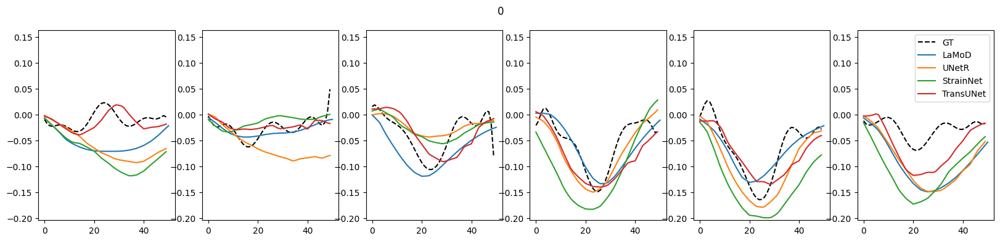

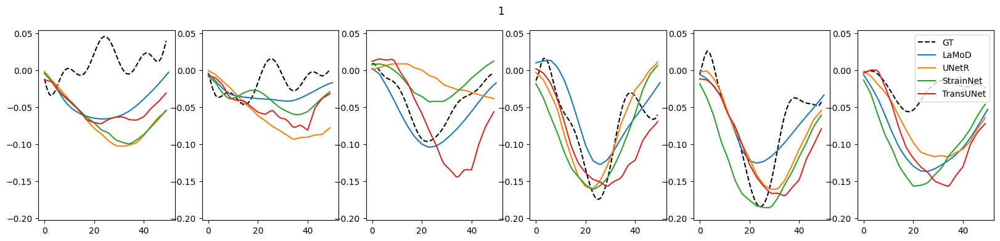

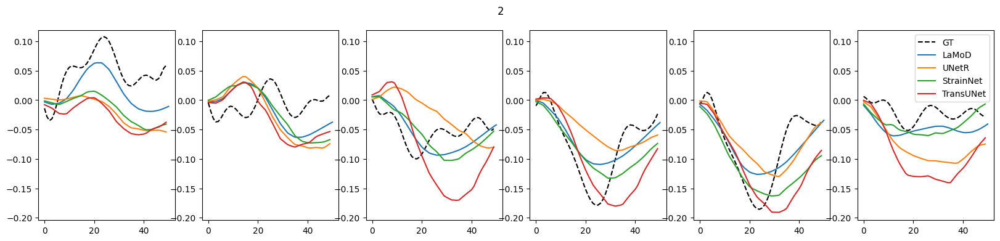

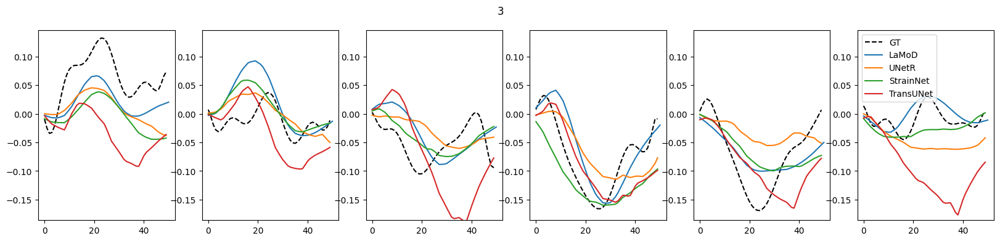

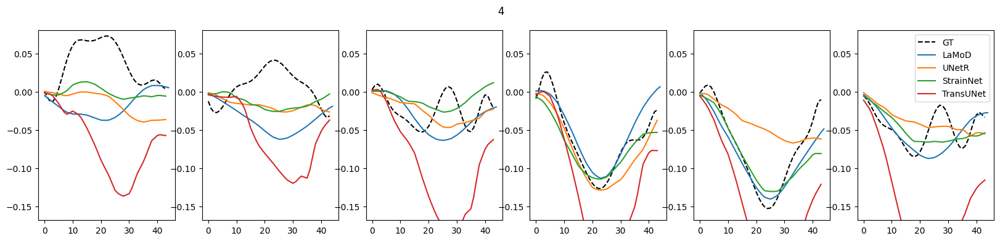

...

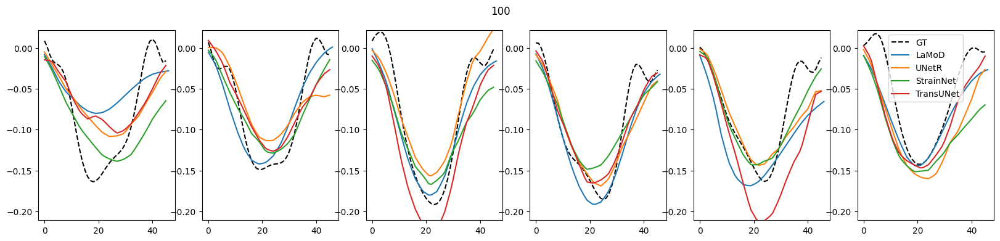

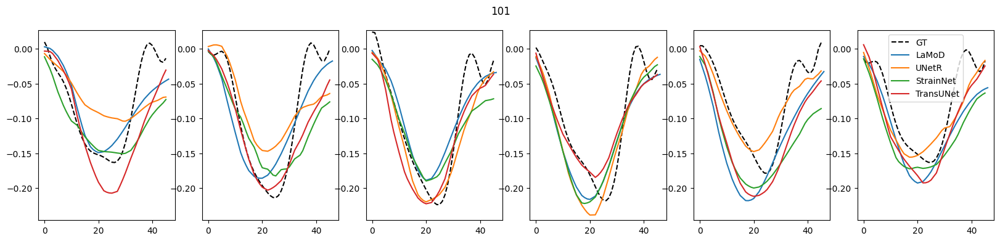

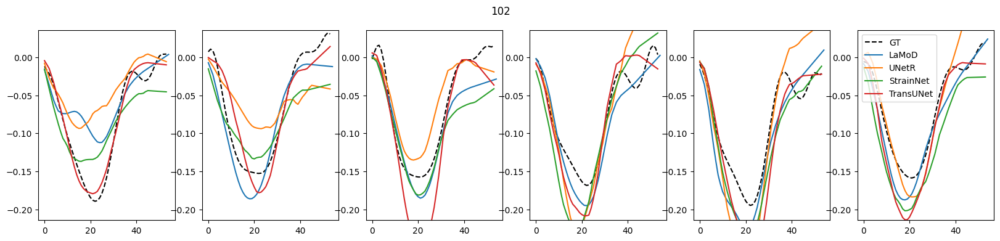

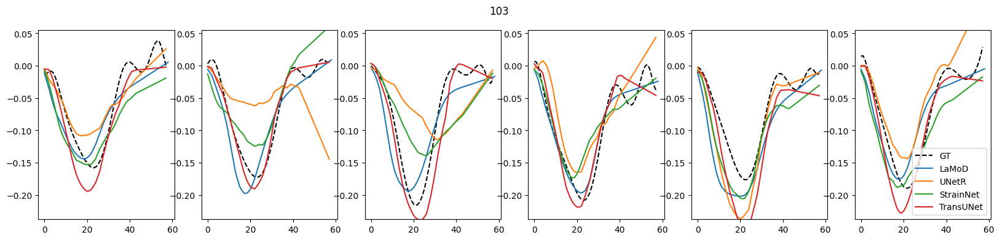

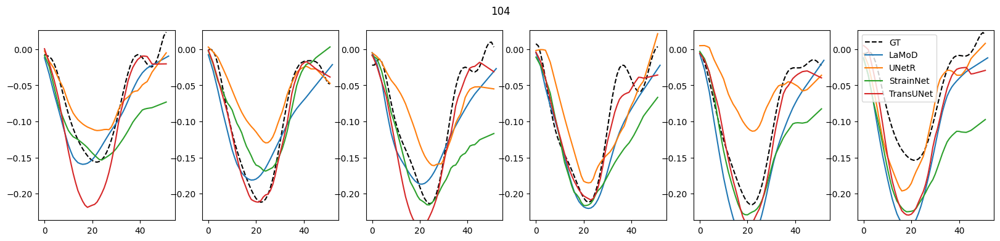

In [21]:
import os
save_one_row_dir = '/home/jx8fh/Projects/LaMoD/debug/notebooks/2025-01-06-plot-all-strain-curves/one-row-cine'
for datum_idx in range(len(data_recompute_strain_prev)):
# for datum_idx in range(70,75):
# for datum_idx in range(70,75):
    fig, axs = plt.subplots(1, 6, figsize=(20, 4))
    for sector_idx in range(6):
        strain_curve_GT = data_recompute_strain_prev[datum_idx]['DENSE_strain']['CCs6'][sector_idx, :-1]
        strain_curve_MotionDecoder = data_recompute_strain_prev[datum_idx]['MotionDecoder1x1_cine_strain']['CCs6Resampled'][sector_idx]
        strain_curve_UNetR = data_recompute_strain_prev[datum_idx]['UNetROri_cine_strain']['CCs6Resampled'][sector_idx, :-1]
        strain_curve_StrainNet = data_recompute_strain_prev[datum_idx]['StrainNetOri_cine_strain']['CCs6Resampled'][sector_idx, :-1]
        strain_curve_TransUNet = data_recompute_strain_transunet[datum_idx]['TransUNetOri_cine_strain']['CCs6Resampled'][sector_idx, :-1]

        strainmat_GT = data_recompute_strain_prev[datum_idx]['DENSE_strain']['CCs6']
        strainmat_GT_max = np.max(strainmat_GT[~np.isnan(strainmat_GT)])    
        strainmat_GT_min = np.min(strainmat_GT[~np.isnan(strainmat_GT)])


        axs[sector_idx].plot(strain_curve_GT, label='GT', linestyle='--', color='black')
        axs[sector_idx].plot(strain_curve_MotionDecoder, label='LaMoD')
        # axs[sector_idx].plot(strain_curve_MotionDecoder*1.5, label='LaMoD1.5')
        axs[sector_idx].plot(strain_curve_UNetR, label='UNetR')
        axs[sector_idx].plot(strain_curve_StrainNet, label='StrainNet')
        axs[sector_idx].plot(strain_curve_TransUNet, label='TransUNet')
        axs[sector_idx].set_ylim(strainmat_GT_min*1.1, strainmat_GT_max*1.1)
    axs[-1].legend()
    fig.suptitle(f'{datum_idx}')
    # save figure
    # fig.savefig(os.path.join(save_one_row_dir, f'{datum_idx}.png'))